In [2]:
import numpy as np
import os
import matplotlib.pyplot as plt
import cv2

import warnings
warnings.filterwarnings('ignore')
import tensorflow as tf
import keras
from tensorflow.keras.optimizers import Adam
from keras.models import Sequential, Model
from keras.layers import Dense, LeakyReLU, Reshape, Flatten,PReLU, Input
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Conv2DTranspose

from tensorflow.compat.v1.keras.layers import BatchNormalization

2023-09-10 12:29:22.944037: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-09-10 12:29:23.161576: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-10 12:29:24.009165: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
def list_images(basePath, contains=None):
    # return the set of files that are valid
    return list_files(basePath, validExts=(".jpg", ".jpeg", ".png", ".bmp"), contains=contains)

def list_files(basePath, validExts=(".jpg", ".jpeg", ".png", ".bmp"), contains=None):
    # loop over the directory structure
    for (rootDir, dirNames, filenames) in os.walk(basePath):
        # loop over the filenames in the current directory
        for filename in filenames:
            # if the contains string is not none and the filename does not contain
            # the supplied string, then ignore the file
            if contains is not None and filename.find(contains) == -1:
                continue

            # determine the file extension of the current file
            ext = filename[filename.rfind("."):].lower()

            # check to see if the file is an image and should be processed
            if ext.endswith(validExts):
                # construct the path to the image and yield it
                imagePath = os.path.join(rootDir, filename).replace(" ", "\\ ")
                yield imagePath

def load_images(directory='', size=(64,64)):
    images = []
    labels = []  # Integers corresponding to the categories in alphabetical order
    label = 0

    imagePaths = list(list_images(directory))

    for path in imagePaths:

        if not('OSX' in path):

            path = path.replace('\\','/')

            image = cv2.imread(path) #Reading the image with OpenCV
            image = cv2.resize(image,size) #Resizing the image, in case some are not of the same size

            images.append(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    return images

In [4]:
images=load_images('data')

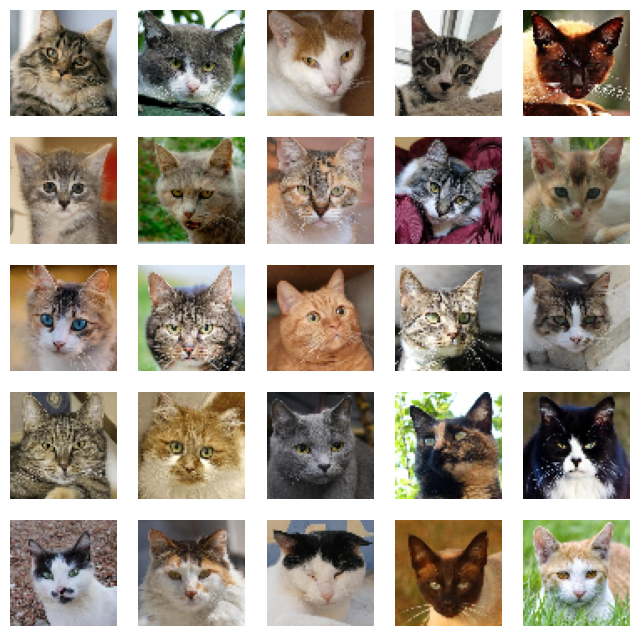

In [5]:
_,ax = plt.subplots(5,5, figsize = (8,8))
for i in range(5):
    for j in range(5):
        ax[i,j].imshow(images[5*i+j])
        ax[i,j].axis('off')

In [6]:
class GAN():
    def __init__(self):
        self.img_shape = (64, 64, 3)

        self.noise_size = 100

        optimizer = tf.keras.optimizers.legacy.Adam(0.0002,0.5)

        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
                                   optimizer=optimizer,
                                   metrics=['accuracy'])

        self.generator = self.build_generator()
        self.generator.compile(loss='binary_crossentropy', optimizer=optimizer)

        self.combined = Sequential()
        self.combined.add(self.generator)
        self.combined.add(self.discriminator)

        self.discriminator.trainable = False

        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)

        self.combined.summary()

    def build_generator(self):
        epsilon = 0.00001
        noise_shape = (self.noise_size,)

        model = Sequential()

        model.add(Dense(4*4*512, activation='linear', input_shape=noise_shape))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Reshape((4, 4, 512)))

        model.add(Conv2DTranspose(512, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
        model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
        model.add(LeakyReLU(alpha=0.2))

        model.add(Conv2DTranspose(256, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
        model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
        model.add(LeakyReLU(alpha=0.2))

        model.add(Conv2DTranspose(128, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
        model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
        model.add(LeakyReLU(alpha=0.2))

        model.add(Conv2DTranspose(64, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
        model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
        model.add(LeakyReLU(alpha=0.2))

        model.add(Conv2DTranspose(3, kernel_size=[4,4], strides=[1,1], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))

        model.add(Activation("tanh"))

        model.summary()

        noise = Input(shape=noise_shape)
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        model = Sequential()

        model.add(Conv2D(128, (3,3), padding='same', input_shape=self.img_shape))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization())
        model.add(Conv2D(128, (3,3), padding='same'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(3,3)))
        model.add(Dropout(0.2))

        model.add(Conv2D(128, (3,3), padding='same'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization())
        model.add(Conv2D(128, (3,3), padding='same'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(3,3)))
        model.add(Dropout(0.3))

        model.add(Flatten())
        model.add(Dense(128))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(128))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))

        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, metrics_update=50, save_images=100, save_model=2000):

        X_train = np.array(images)
        X_train = (X_train.astype(np.float32) - 127.5) / 127.5

        half_batch = int(batch_size / 2)

        mean_d_loss=[0,0]
        mean_g_loss=0

        for epoch in range(epochs):
            idx = np.random.randint(0, X_train.shape[0], half_batch)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (half_batch, self.noise_size))
            gen_imgs = self.generator.predict(noise)

            d_loss = 0.5 * np.add(self.discriminator.train_on_batch(imgs, np.ones((half_batch, 1))),
                                  self.discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1))))

            for _ in range(2):
              noise = np.random.normal(0, 1, (batch_size, self.noise_size))

              valid_y = np.array([1] * batch_size)
              g_loss = self.combined.train_on_batch(noise, valid_y)

            mean_d_loss[0] += d_loss[0]
            mean_d_loss[1] += d_loss[1]
            mean_g_loss += g_loss

            if epoch % metrics_update == 0:
                print ("%d [Discriminator loss: %f, acc.: %.2f%%] [Generator loss: %f]" % (epoch, mean_d_loss[0]/metrics_update, 100*mean_d_loss[1]/metrics_update, mean_g_loss/metrics_update))
                mean_d_loss=[0,0]
                mean_g_loss=0

            if epoch % save_images == 0:
                self.save_images(epoch)

            if epoch % save_model == 0:
                self.generator.save("generator_%d" % epoch)
                self.discriminator.save("discriminator_%d" % epoch)

    def save_images(self, epoch):
        noise = np.random.normal(0, 1, (25, self.noise_size))
        gen_imgs = self.generator.predict(noise)

        # Rescale from [-1,1] into [0,1]
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(5,5, figsize = (8,8))

        for i in range(5):
            for j in range(5):
                axs[i,j].imshow(gen_imgs[5*i+j])
                axs[i,j].axis('off')

        plt.show()

        fig.savefig("generatedPics/GANCAT_%d.png" % epoch)
        plt.close()

In [7]:
!mkdir generatedPics

In [8]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 128)       3584      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64, 64, 128)       0         
                                                                 
 batch_normalization (Batch  (None, 64, 64, 128)       512       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 128)       147584    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                                 
 batch_normalization_1 (Bat  (None, 64, 64, 128)       512       
 chNormalization)                                       

2023-09-10 12:30:02.770046: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-09-10 12:30:02.770127: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-09-10 12:30:02.770144: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-09-10 12:30:03.618087: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-09-10 12:30:03.618149: I tensorflow/compile

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 8192)              827392    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 8192)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 8, 8, 512)         4194816   
 anspose)                                                        
                                                                 
 batch_normalization_4 (Bat  (None, 8, 8, 512)         2048      
 chNormalization)                                                
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 8, 8, 512)        

2023-09-10 12:30:05.718396: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-09-10 12:30:05.879844: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8903


2/2 [==============================] - 3s 4ms/step


2023-09-10 12:30:08.208352: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/sequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2023-09-10 12:30:10.716535: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_2/model/sequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2023-09-10 12:30:11.023526: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 5.65GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


0 [Discriminator loss: 0.022556, acc.: 0.13%] [Generator loss: 0.000367]
1/1 [==============================] - 0s 497ms/step


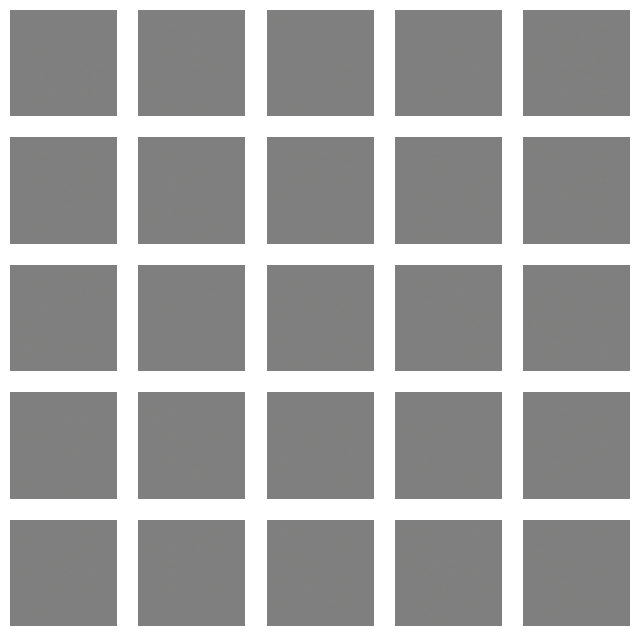

INFO:tensorflow:Assets written to: generator_0/assets


INFO:tensorflow:Assets written to: generator_0/assets


INFO:tensorflow:Assets written to: discriminator_0/assets


INFO:tensorflow:Assets written to: discriminator_0/assets


2/2 [==============================] - 0s 7ms/step
250 [Discriminator loss: 0.603127, acc.: 69.64%] [Generator loss: 1.395626]
2/2 [==============================] - 0s 6ms/step
500 [Discriminator loss: 0.687942, acc.: 57.46%] [Generator loss: 0.991950]
1/1 [==============================] - 0s 15ms/step


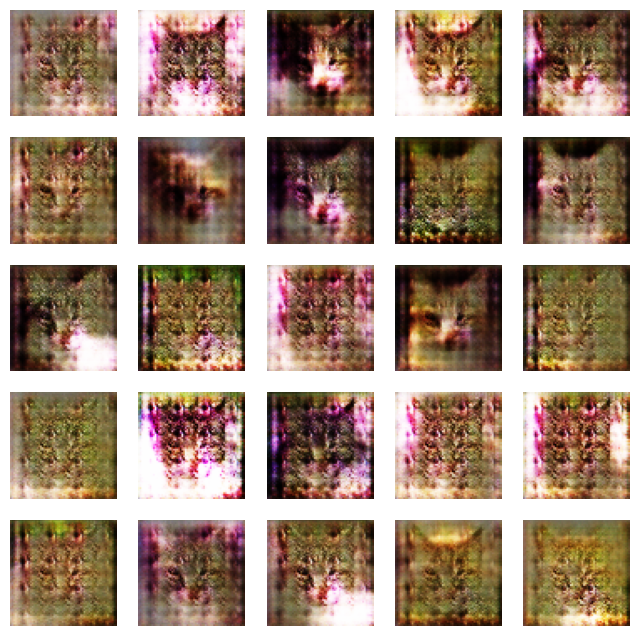

2/2 [==============================] - 0s 6ms/step
750 [Discriminator loss: 0.694059, acc.: 54.96%] [Generator loss: 0.937272]
2/2 [==============================] - 0s 6ms/step
1000 [Discriminator loss: 0.689626, acc.: 54.85%] [Generator loss: 0.895715]
1/1 [==============================] - 0s 14ms/step


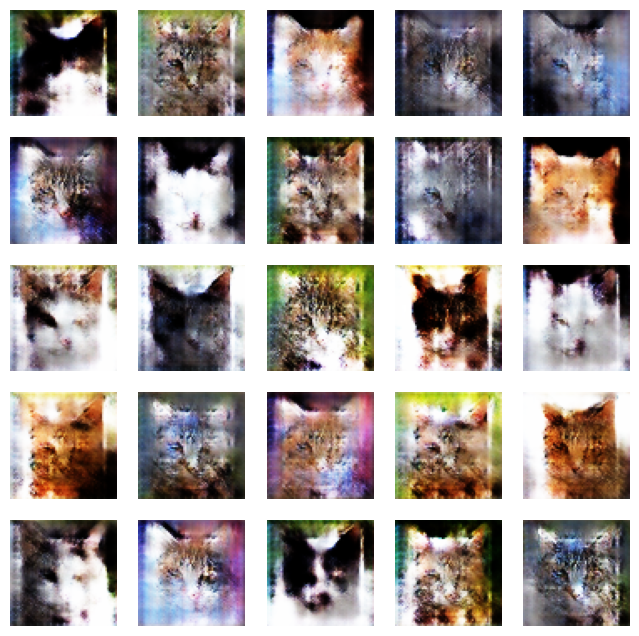

2/2 [==============================] - 0s 6ms/step
1250 [Discriminator loss: 0.675910, acc.: 57.19%] [Generator loss: 0.893331]
2/2 [==============================] - 0s 7ms/step
1500 [Discriminator loss: 0.681985, acc.: 56.87%] [Generator loss: 0.891712]
1/1 [==============================] - 0s 14ms/step


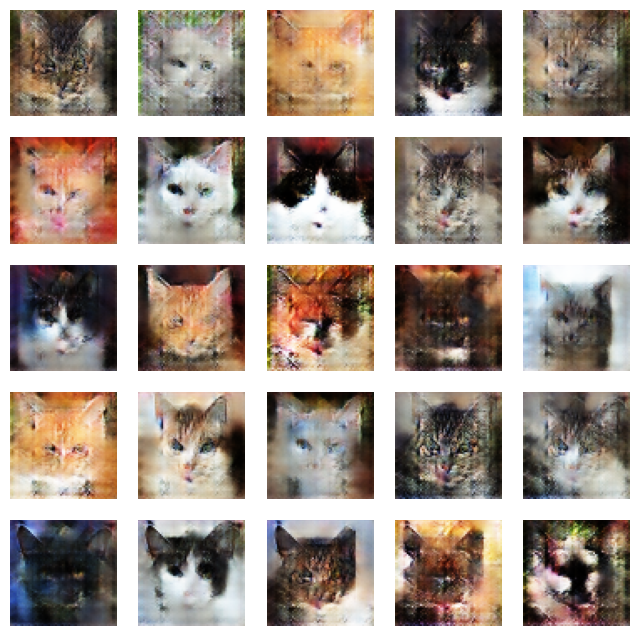

2/2 [==============================] - 0s 6ms/step
1750 [Discriminator loss: 0.684218, acc.: 56.11%] [Generator loss: 0.842757]
2/2 [==============================] - 0s 6ms/step
2000 [Discriminator loss: 0.691655, acc.: 54.80%] [Generator loss: 0.821234]
1/1 [==============================] - 0s 14ms/step


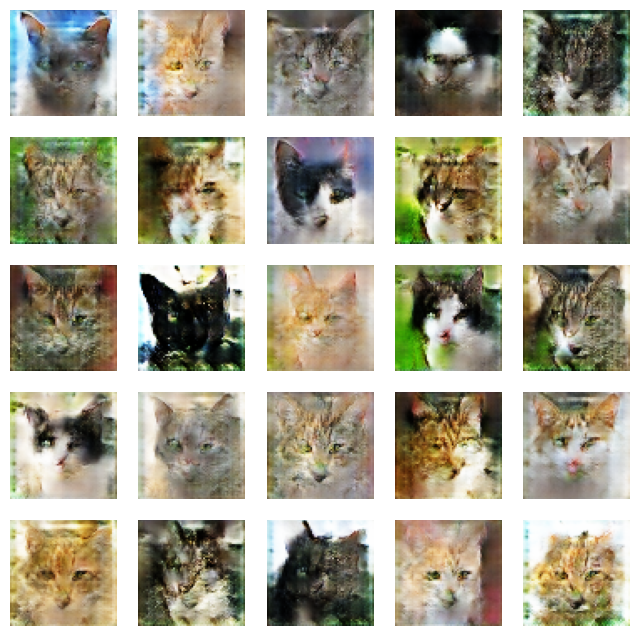

2/2 [==============================] - 0s 6ms/step
2250 [Discriminator loss: 0.679915, acc.: 56.73%] [Generator loss: 0.838244]
2/2 [==============================] - 0s 9ms/step
2500 [Discriminator loss: 0.662564, acc.: 59.43%] [Generator loss: 0.786329]
1/1 [==============================] - 0s 15ms/step


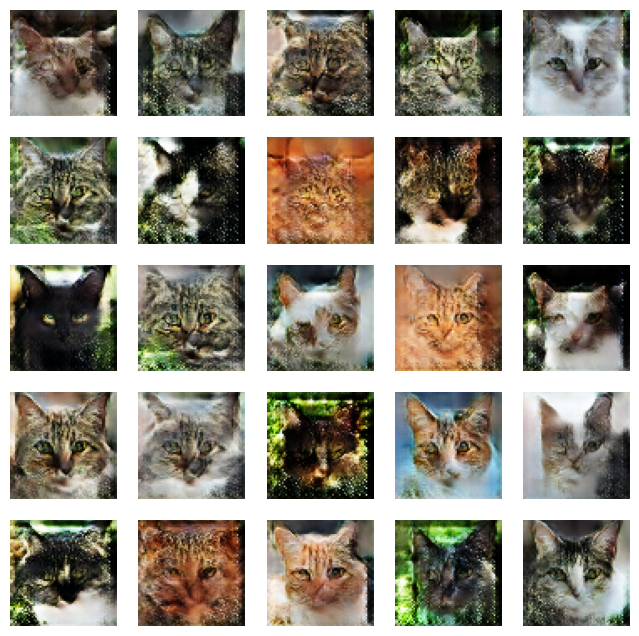

2/2 [==============================] - 0s 6ms/step
2750 [Discriminator loss: 0.671452, acc.: 57.85%] [Generator loss: 0.805433]
2/2 [==============================] - 0s 6ms/step
3000 [Discriminator loss: 0.661244, acc.: 59.72%] [Generator loss: 0.818342]
1/1 [==============================] - 0s 13ms/step


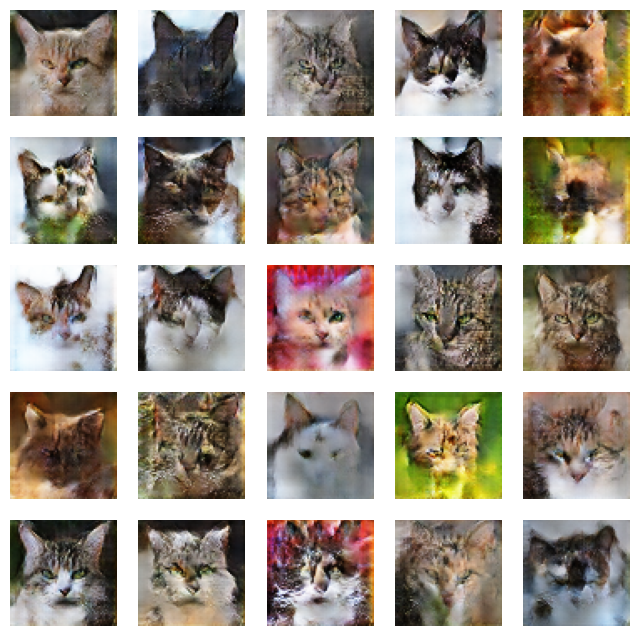

2/2 [==============================] - 0s 6ms/step
3250 [Discriminator loss: 0.654303, acc.: 61.00%] [Generator loss: 0.819268]
2/2 [==============================] - 0s 7ms/step
3500 [Discriminator loss: 0.647613, acc.: 61.20%] [Generator loss: 0.854110]
1/1 [==============================] - 0s 14ms/step


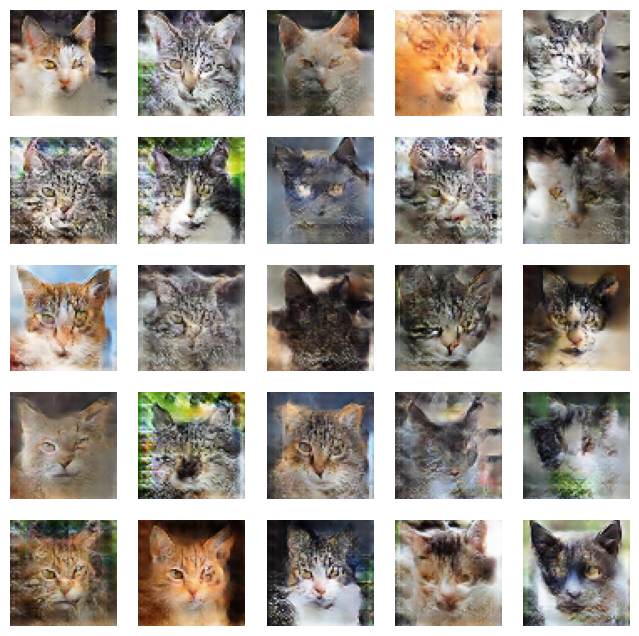

2/2 [==============================] - 0s 7ms/step
3750 [Discriminator loss: 0.623295, acc.: 64.59%] [Generator loss: 0.822188]
2/2 [==============================] - 0s 6ms/step
4000 [Discriminator loss: 0.613554, acc.: 66.03%] [Generator loss: 0.875921]
1/1 [==============================] - 0s 14ms/step


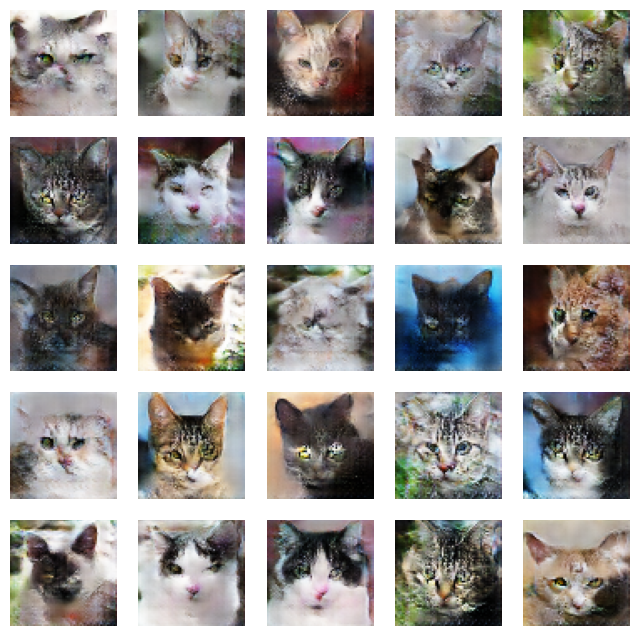

2/2 [==============================] - 0s 8ms/step
4250 [Discriminator loss: 0.595631, acc.: 67.34%] [Generator loss: 0.910552]
2/2 [==============================] - 0s 7ms/step
4500 [Discriminator loss: 0.602394, acc.: 67.11%] [Generator loss: 0.970873]
1/1 [==============================] - 0s 16ms/step


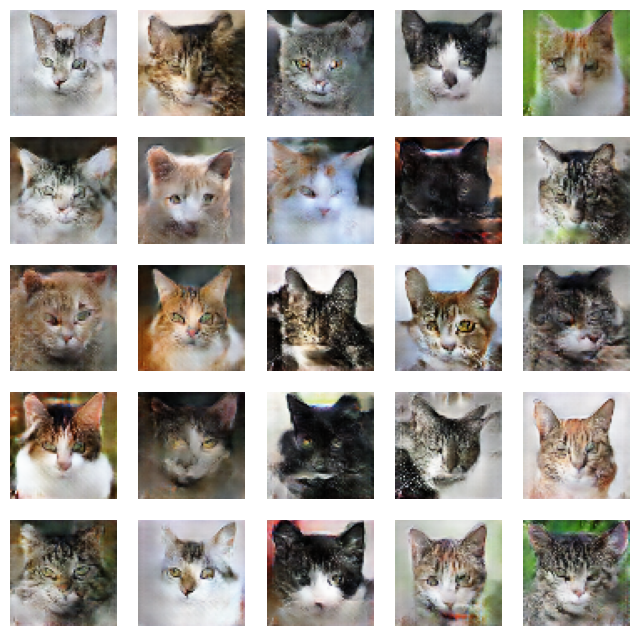

2/2 [==============================] - 0s 7ms/step
4750 [Discriminator loss: 0.585639, acc.: 68.54%] [Generator loss: 1.029890]
2/2 [==============================] - 0s 6ms/step
5000 [Discriminator loss: 0.567157, acc.: 70.06%] [Generator loss: 1.077301]
1/1 [==============================] - 0s 14ms/step


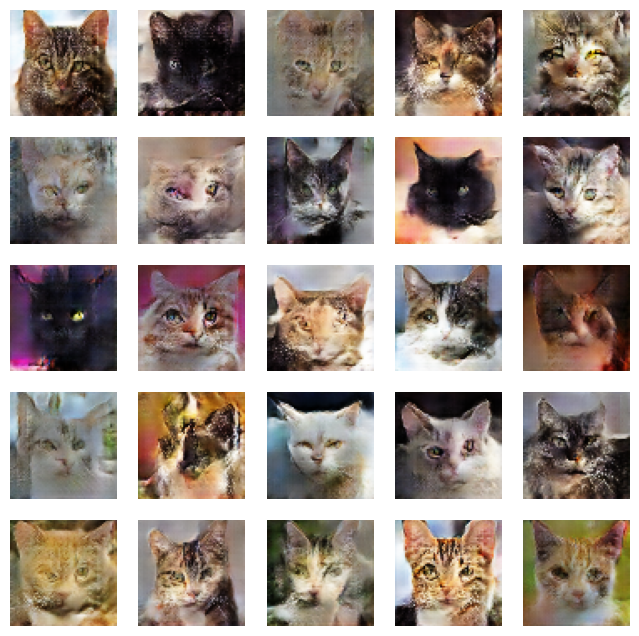

2/2 [==============================] - 0s 7ms/step
5250 [Discriminator loss: 0.553408, acc.: 71.33%] [Generator loss: 1.136470]
2/2 [==============================] - 0s 6ms/step
5500 [Discriminator loss: 0.531536, acc.: 73.13%] [Generator loss: 1.183717]
1/1 [==============================] - 0s 14ms/step


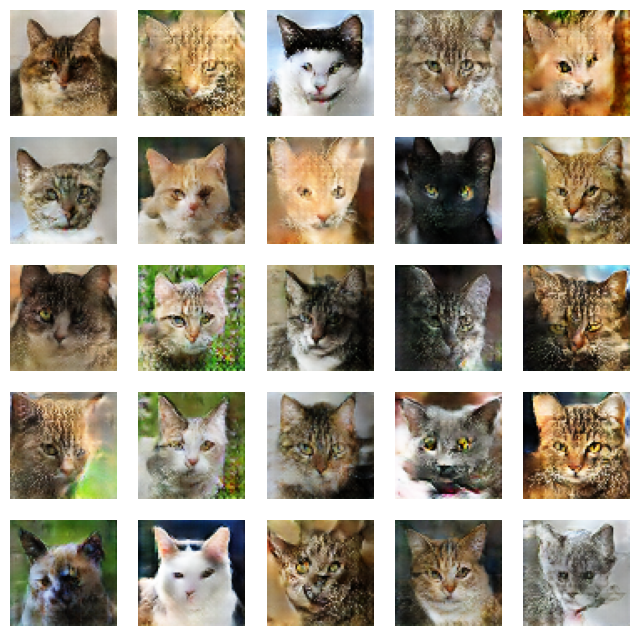

2/2 [==============================] - 0s 6ms/step
5750 [Discriminator loss: 0.515863, acc.: 74.59%] [Generator loss: 1.243053]
2/2 [==============================] - 0s 6ms/step
6000 [Discriminator loss: 0.497022, acc.: 75.75%] [Generator loss: 1.313854]
1/1 [==============================] - 0s 15ms/step


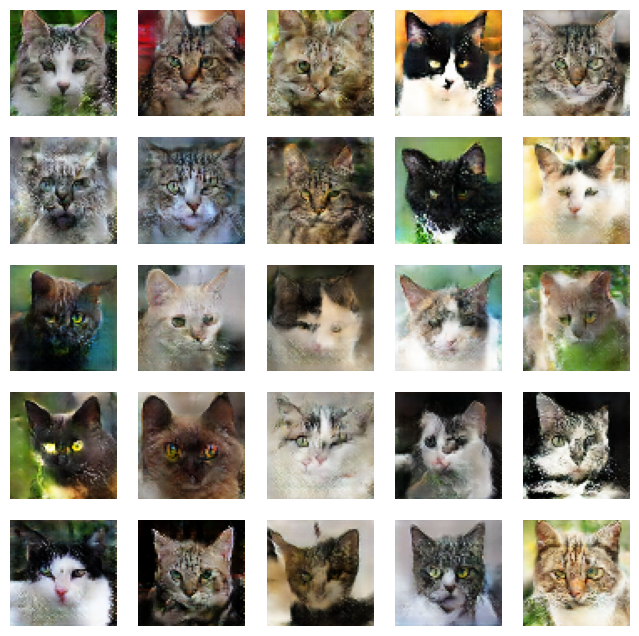

2/2 [==============================] - 0s 6ms/step
6250 [Discriminator loss: 0.475676, acc.: 77.84%] [Generator loss: 1.397039]
2/2 [==============================] - 0s 7ms/step
6500 [Discriminator loss: 0.454947, acc.: 79.11%] [Generator loss: 1.493443]
1/1 [==============================] - 0s 14ms/step


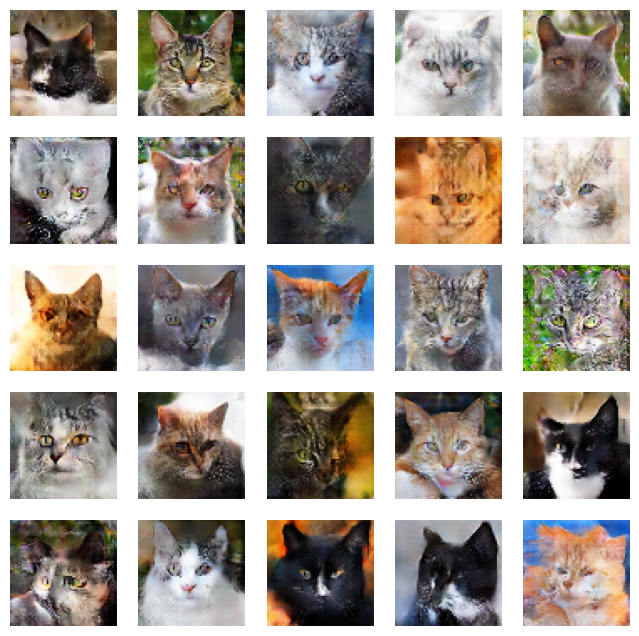

2/2 [==============================] - 0s 6ms/step
6750 [Discriminator loss: 0.440663, acc.: 80.10%] [Generator loss: 1.605398]
2/2 [==============================] - 0s 7ms/step
7000 [Discriminator loss: 0.421567, acc.: 81.24%] [Generator loss: 1.675979]
1/1 [==============================] - 0s 17ms/step


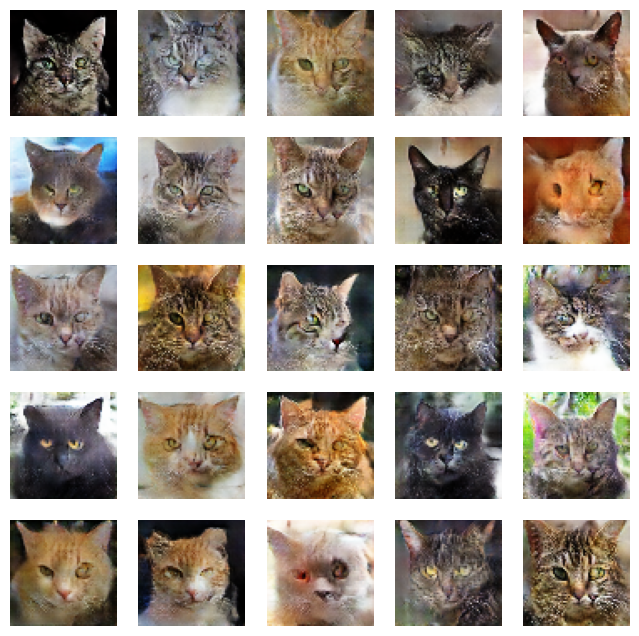

2/2 [==============================] - 0s 7ms/step
7250 [Discriminator loss: 0.398783, acc.: 82.34%] [Generator loss: 1.783324]
2/2 [==============================] - 0s 6ms/step
7500 [Discriminator loss: 0.381949, acc.: 83.45%] [Generator loss: 1.891193]
1/1 [==============================] - 0s 15ms/step


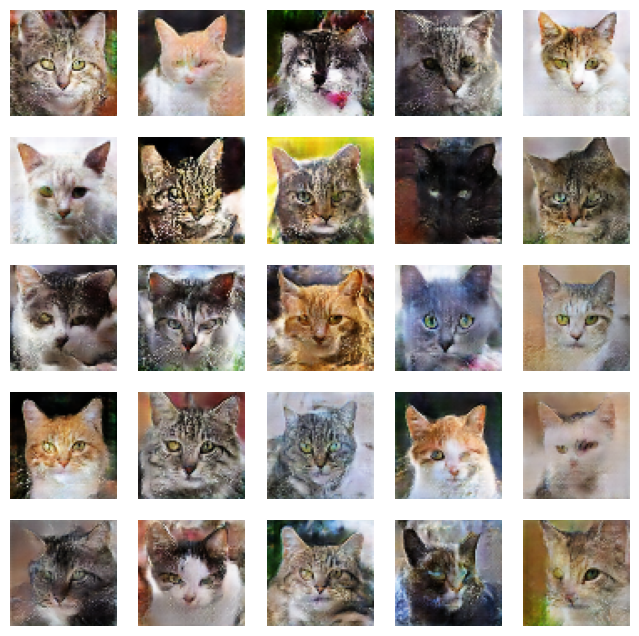

2/2 [==============================] - 0s 6ms/step
7750 [Discriminator loss: 0.370852, acc.: 83.98%] [Generator loss: 1.970505]
2/2 [==============================] - 0s 7ms/step
8000 [Discriminator loss: 0.352155, acc.: 85.41%] [Generator loss: 2.034423]
1/1 [==============================] - 0s 15ms/step


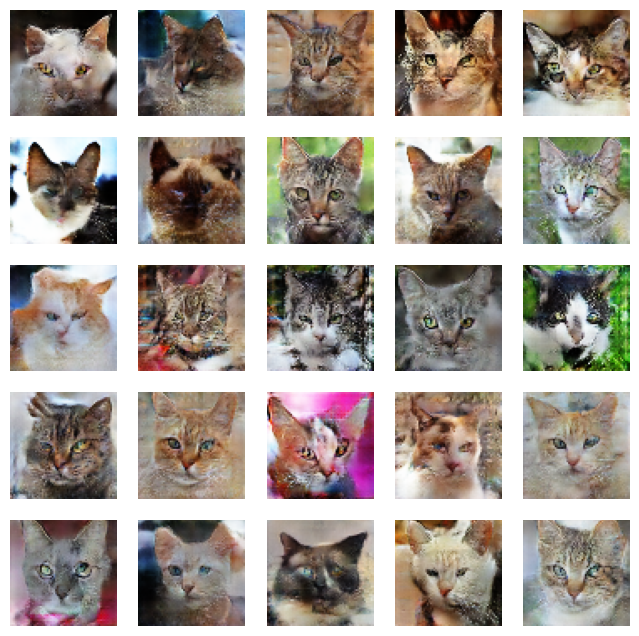

2/2 [==============================] - 0s 5ms/step
8250 [Discriminator loss: 0.339177, acc.: 85.96%] [Generator loss: 2.152022]
2/2 [==============================] - 0s 7ms/step
8500 [Discriminator loss: 0.317971, acc.: 87.23%] [Generator loss: 2.317213]
1/1 [==============================] - 0s 14ms/step


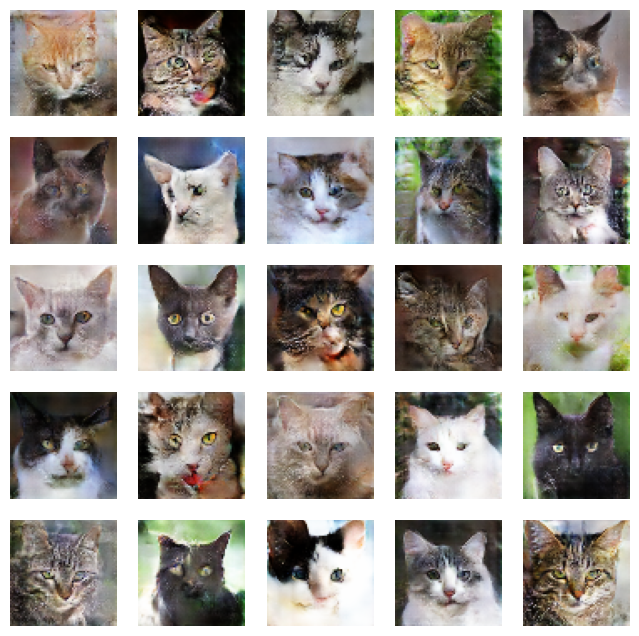

2/2 [==============================] - 0s 7ms/step
8750 [Discriminator loss: 0.315765, acc.: 87.07%] [Generator loss: 2.357497]
2/2 [==============================] - 0s 6ms/step
9000 [Discriminator loss: 0.302049, acc.: 87.65%] [Generator loss: 2.459571]
1/1 [==============================] - 0s 15ms/step


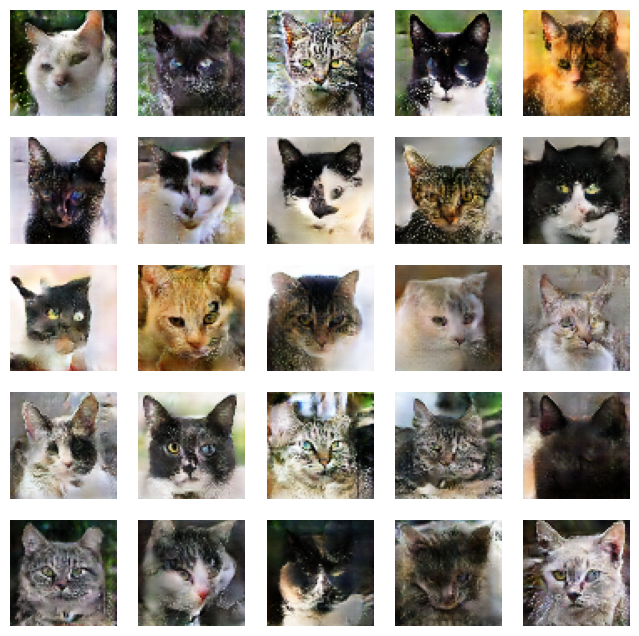

2/2 [==============================] - 0s 6ms/step
9250 [Discriminator loss: 0.289333, acc.: 88.47%] [Generator loss: 2.594102]
2/2 [==============================] - 0s 6ms/step
9500 [Discriminator loss: 0.279982, acc.: 88.72%] [Generator loss: 2.648055]
1/1 [==============================] - 0s 14ms/step


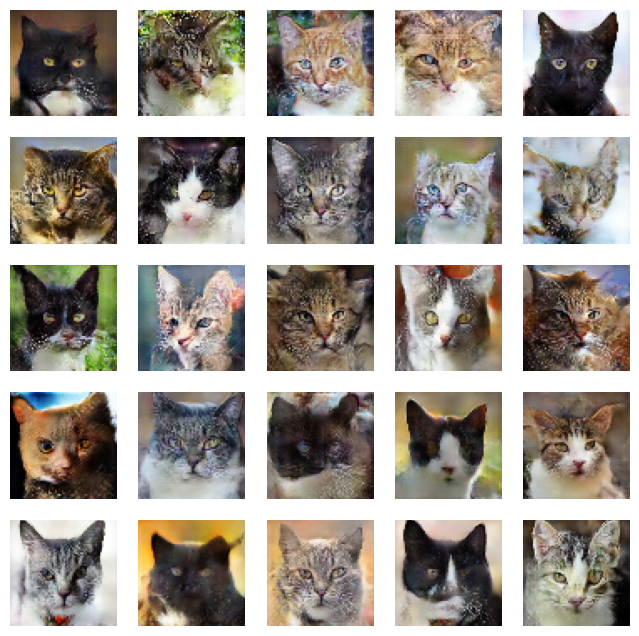

2/2 [==============================] - 0s 6ms/step
9750 [Discriminator loss: 0.269834, acc.: 89.13%] [Generator loss: 2.761166]
2/2 [==============================] - 0s 5ms/step
10000 [Discriminator loss: 0.258678, acc.: 89.72%] [Generator loss: 2.843311]
1/1 [==============================] - 0s 14ms/step


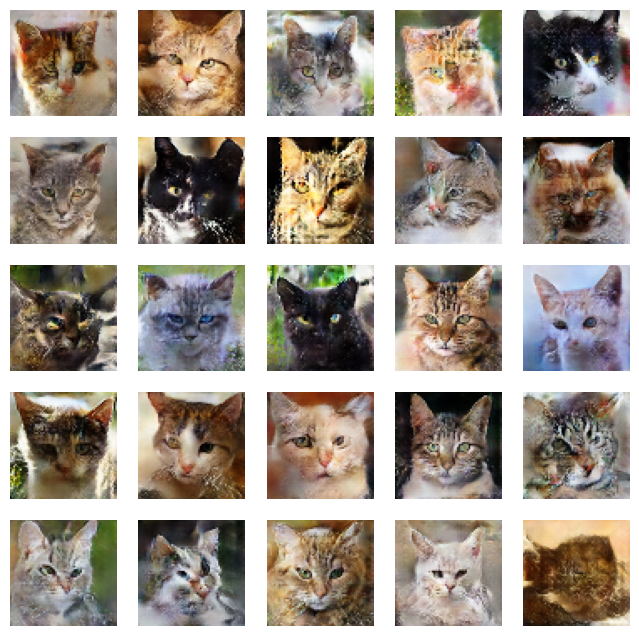

INFO:tensorflow:Assets written to: generator_10000/assets


INFO:tensorflow:Assets written to: generator_10000/assets


INFO:tensorflow:Assets written to: discriminator_10000/assets


INFO:tensorflow:Assets written to: discriminator_10000/assets


In [9]:
gan=GAN()
gan.train(epochs=10001, batch_size=128, metrics_update=250, save_images=500, save_model=10000)